In [ ]:
!pip install opencv-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install numpy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!git clone https://github.com/antoinelame/GazeTracking.git

Cloning into 'GazeTracking'...
remote: Enumerating objects: 113, done.
remote: Counting objects: 100% (46/46), done.
remote: Compressing objects: 100% (18/18), done.
remote: Total 113 (delta 34), reused 28 (delta 28), pack-reused 67
Receiving objects: 100% (113/113), 69.00 MiB | 21.94 MiB/s, done.
Resolving deltas: 100% (56/56), done.


In [ ]:
!pip install dlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import sys
sys.path.append('/content/GazeTracking/gaze_tracking')

CPU times: user 6 µs, sys: 1e+03 ns, total: 7 µs
Wall time: 12.6 µs


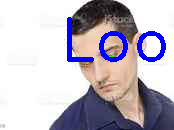

In [ ]:
%time
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("/content/t26.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)
cv2_imshow(new_frame)

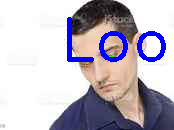

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("/content/t26.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)
cv2_imshow(new_frame)

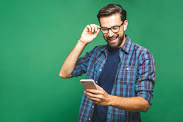

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("t18.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (90, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)
cv2_imshow(new_frame)

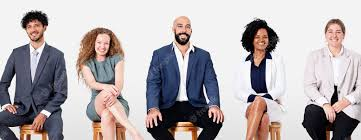

In [ ]:
import cv2
from gaze_tracking import GazeTracking

gaze = GazeTracking()

from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("t23.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(frame, text, (90, 60), cv2.FONT_HERSHEY_DUPLEX, 1.6, (147, 58, 31), 2)

left_pupil = gaze.pupil_left_coords()
right_pupil = gaze.pupil_right_coords()
cv2.putText(frame, "Left pupil:  " + str(left_pupil), (90, 130), cv2.FONT_HERSHEY_DUPLEX, 0.9, (147, 58, 31), 1)
cv2.putText(frame, "Right pupil: " + str(right_pupil), (90, 165), cv2.FONT_HERSHEY_DUPLEX, 0.9, (147, 58, 31), 1)
cv2_imshow(new_frame)

In [ ]:
# import dependencies
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io
import html
import time

In [ ]:
# function to convert the JavaScript object into an OpenCV image
def js_to_image(js_reply):
  """
  Params:
          js_reply: JavaScript object containing image from webcam
  Returns:
          img: OpenCV BGR image
  """
  # decode base64 image
  image_bytes = b64decode(js_reply.split(',')[1])
  # convert bytes to numpy array
  jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
  # decode numpy array into OpenCV BGR image
  img = cv2.imdecode(jpg_as_np, flags=1)

  return img

# function to convert OpenCV Rectangle bounding box image into base64 byte string to be overlayed on video stream
def bbox_to_bytes(bbox_array):
  """
  Params:
          bbox_array: Numpy array (pixels) containing rectangle to overlay on video stream.
  Returns:
        bytes: Base64 image byte string
  """
  # convert array into PIL image
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')
  iobuf = io.BytesIO()
  # format bbox into png for return
  bbox_PIL.save(iobuf, format='png')
  # format return string
  bbox_bytes = 'data:image/png;base64,{}'.format((str(b64encode(iobuf.getvalue()), 'utf-8')))

  return bbox_bytes

In [ ]:
def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)

  # get photo data
  data = eval_js('takePhoto({})'.format(quality))
  # get OpenCV format image
  img = js_to_image(data) 
  # grayscale img
  gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
  if gaze.is_blinking():
    text = "Blinking or closed the eyes"
  elif gaze.is_right():
    text = "Looking right"
  elif gaze.is_left():
    text = "Looking left"
  elif gaze.is_center():
    text = "Looking center"
  
  # save image
  cv2.imwrite(filename, img)

  return filename

<IPython.core.display.Javascript object>

Saved to photo.jpg


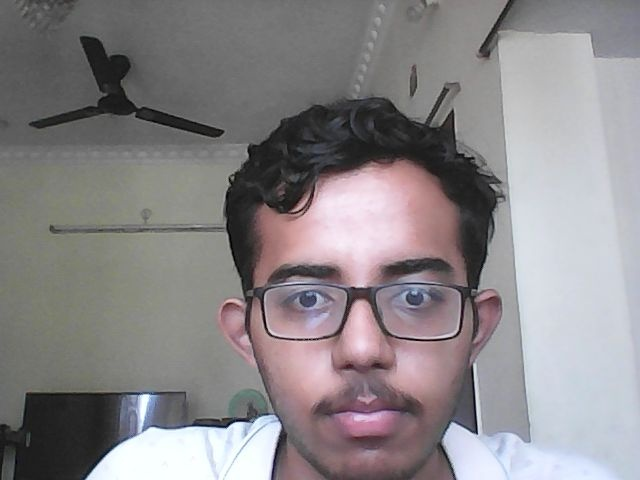

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

In [ ]:
import cv2
from gaze_tracking import GazeTracking

gaze = GazeTracking()

from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(frame, text, (90, 60), cv2.FONT_HERSHEY_DUPLEX, 1.6, (147, 58, 31), 2)

left_pupil = gaze.pupil_left_coords()
right_pupil = gaze.pupil_right_coords()
cv2.putText(frame, "Left pupil:  " + str(left_pupil), (90, 130), cv2.FONT_HERSHEY_DUPLEX, 0.9, (147, 58, 31), 1)
cv2.putText(frame, "Right pupil: " + str(right_pupil), (90, 165), cv2.FONT_HERSHEY_DUPLEX, 0.9, (147, 58, 31), 1)
cv2_imshow(new_frame)

error: ignored

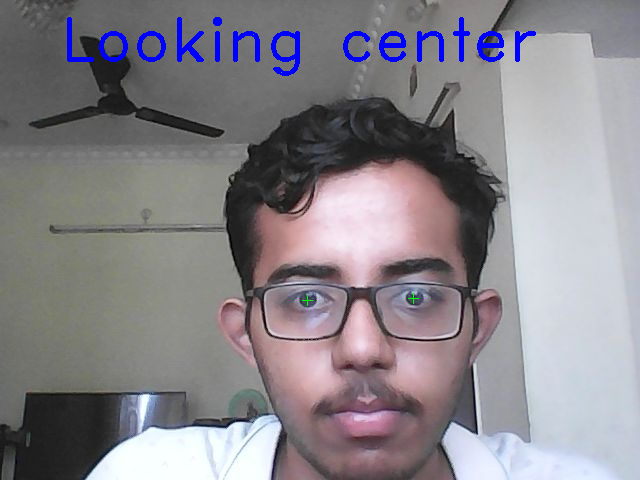

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)
cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


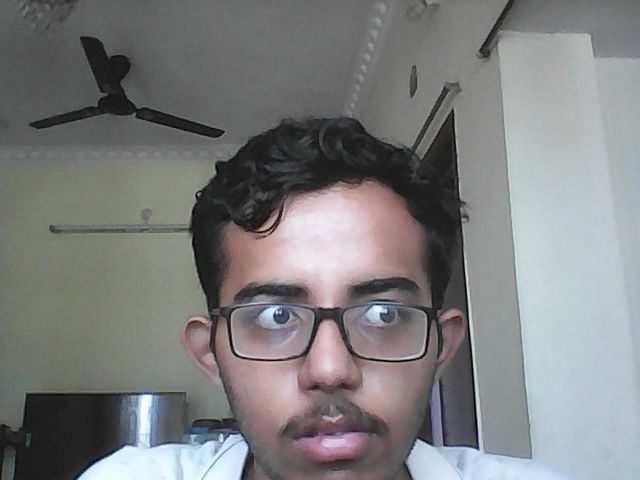

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

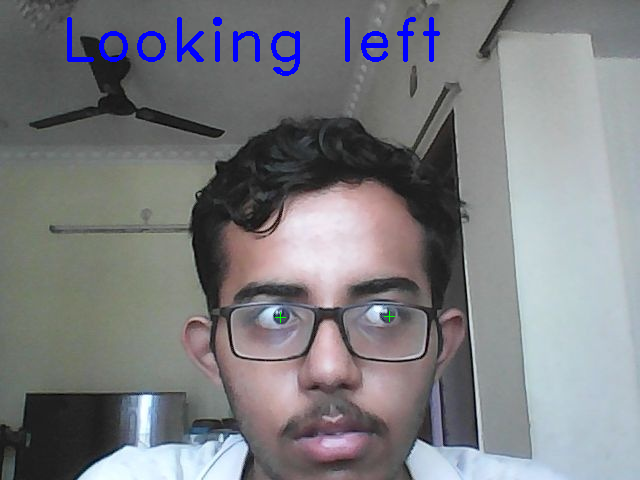

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)
cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


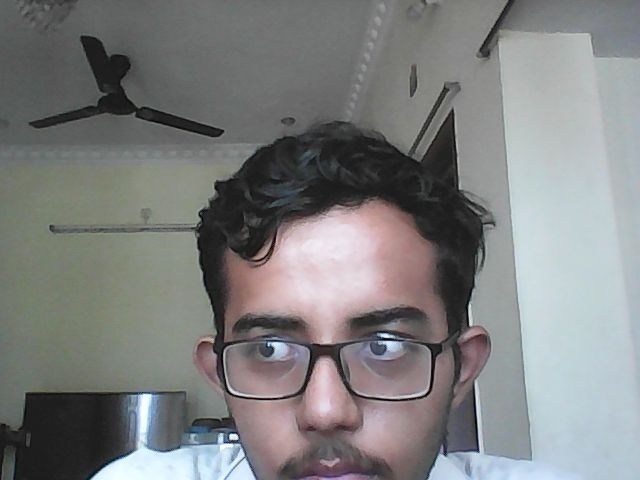

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

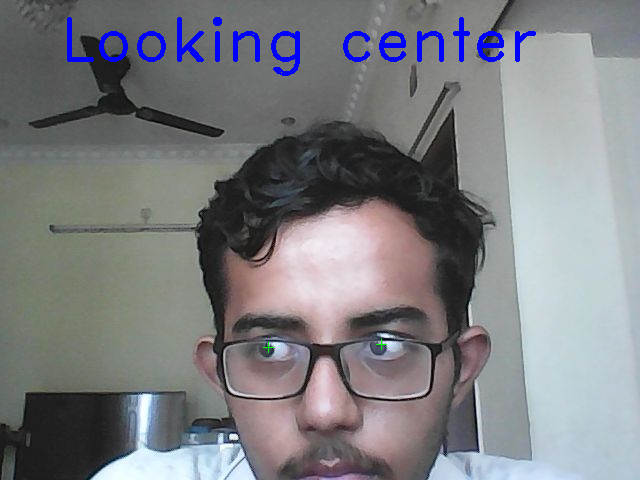

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)
cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


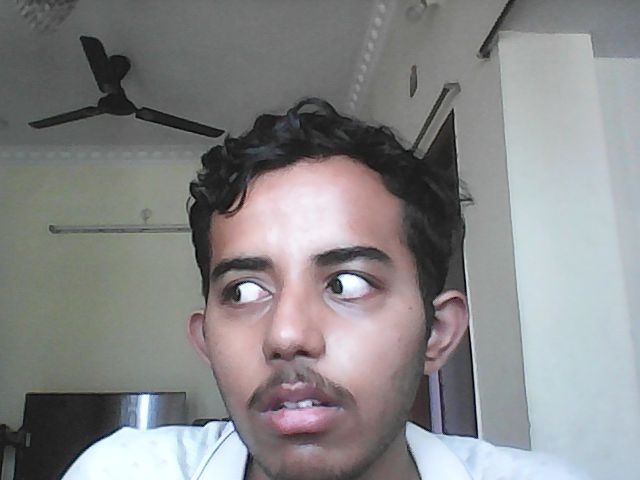

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

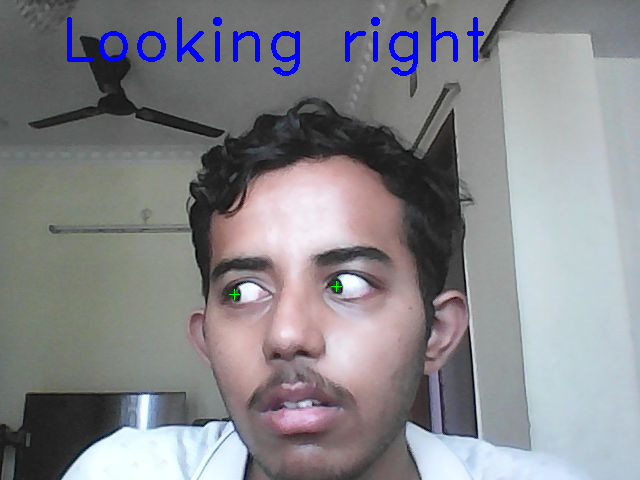

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)
cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


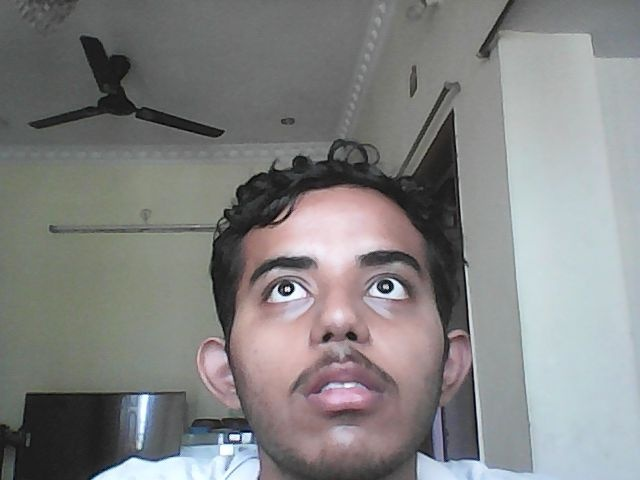

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

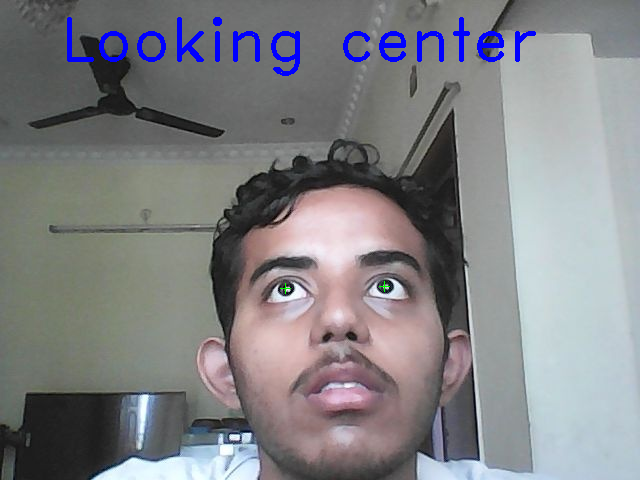

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"
elif gaze.is_up():
  text = "Looking up"
else:
  text = "Looking down"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)
cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


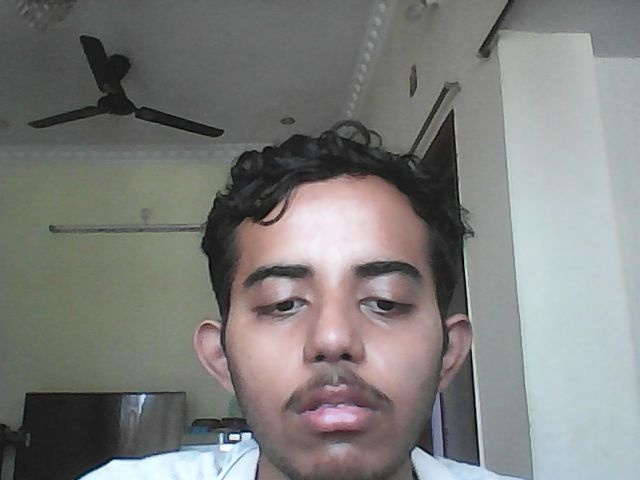

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

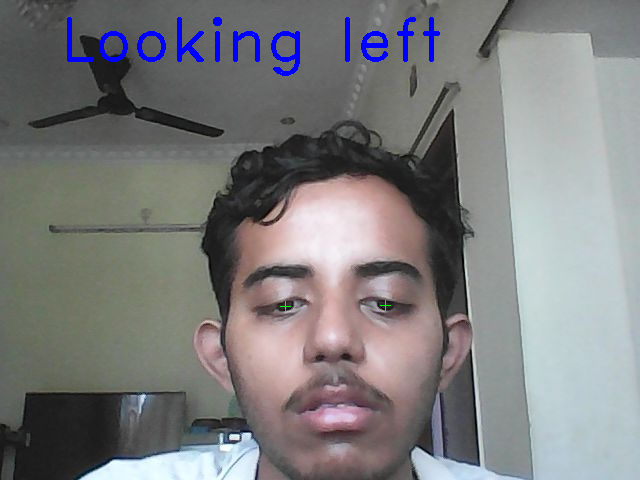

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"
elif gaze.is_up():
  text = "Looking up"
else:
  text = "Looking down"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)
cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


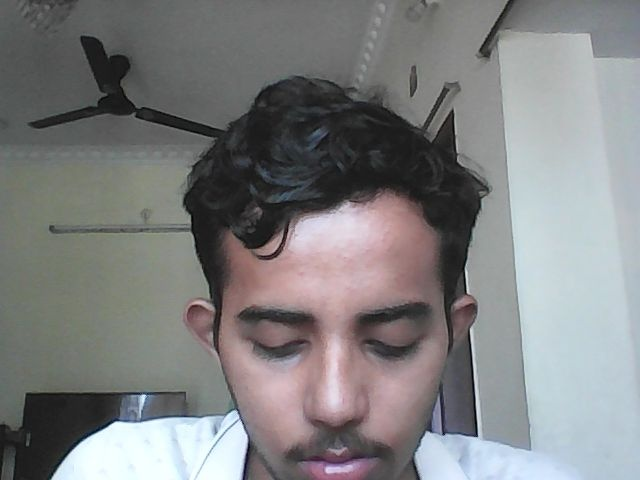

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

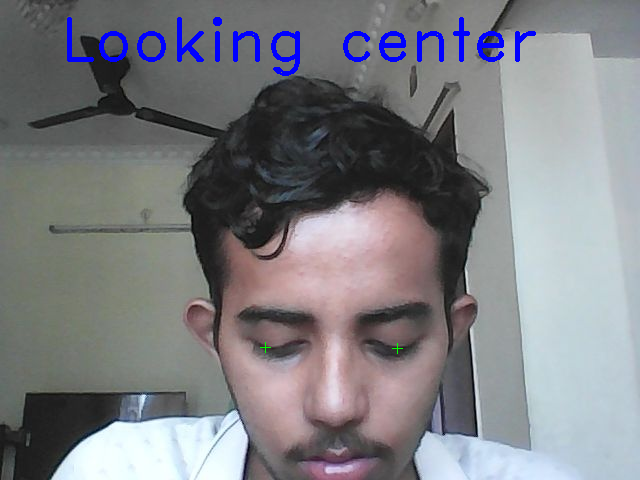

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"
elif gaze.is_up():
  text = "Looking up"
else:
  text = "Looking down"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)
cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


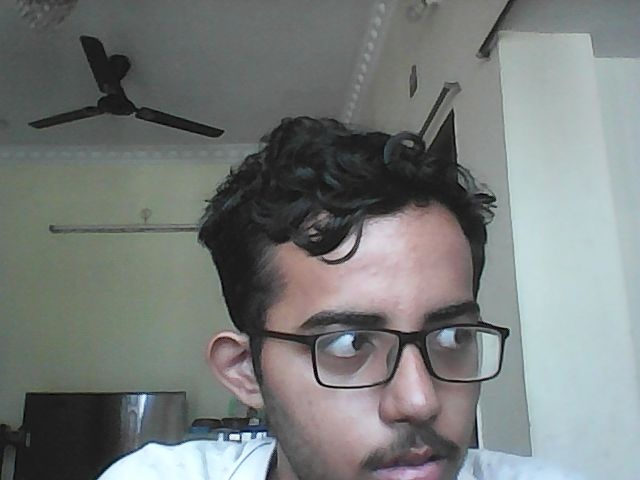

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

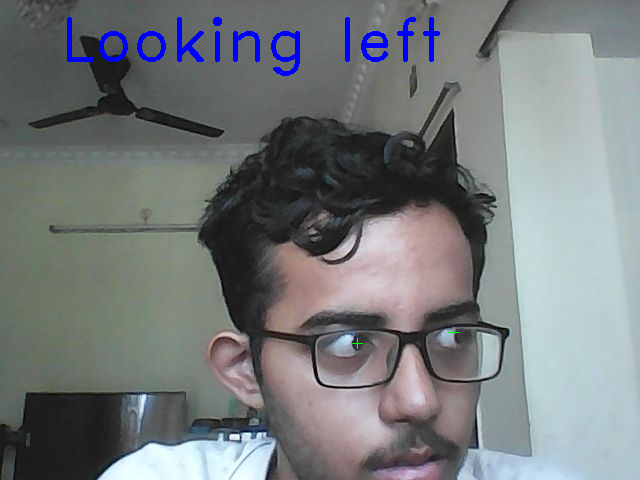

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

left_pupil = gaze.pupil_left_coords()
right_pupil = gaze.pupil_right_coords()

if left_pupil is not None and right_pupil is not None:
    if left_pupil[1] > right_pupil[1]:
        cv2.putText(new_frame, "Looking up", (60, 100), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)
    elif left_pupil[1] < right_pupil[1]:
        cv2.putText(new_frame, "Looking down", (60, 100), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)
    else:
        cv2.putText(new_frame, "Looking center", (60, 100), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)


cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


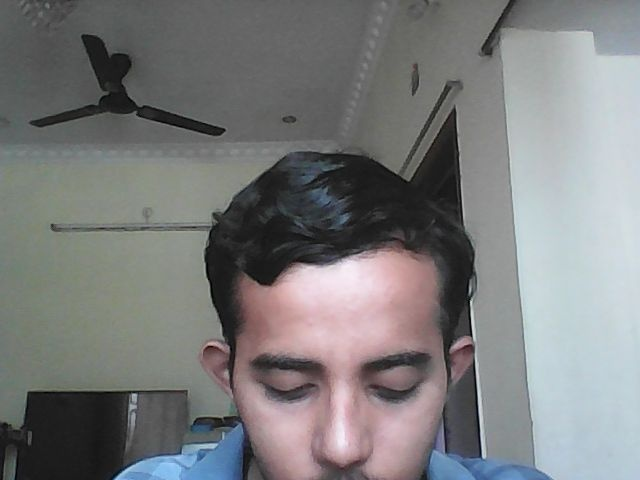

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

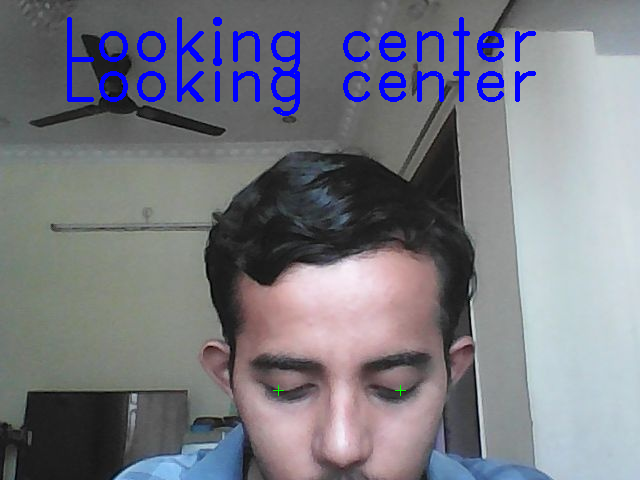

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

left_pupil = gaze.pupil_left_coords()
right_pupil = gaze.pupil_right_coords()

if left_pupil is not None and right_pupil is not None:
    if left_pupil[1] > right_pupil[1]:
        cv2.putText(new_frame, "Looking up", (60, 100), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)
    elif left_pupil[1] < right_pupil[1]:
        cv2.putText(new_frame, "Looking down", (60, 100), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)
    else:
        cv2.putText(new_frame, "Looking center", (60, 100), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


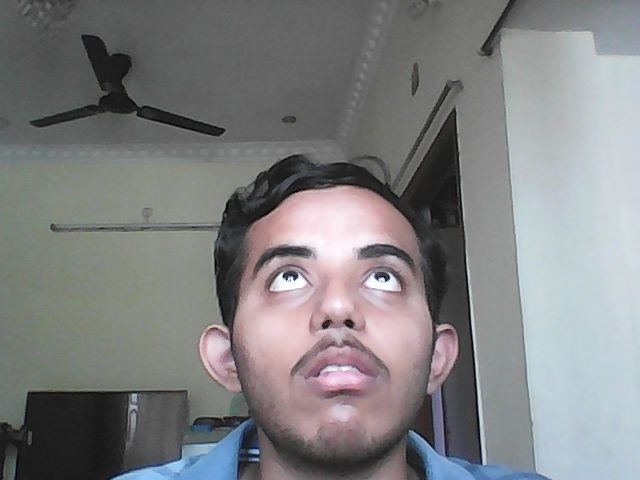

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

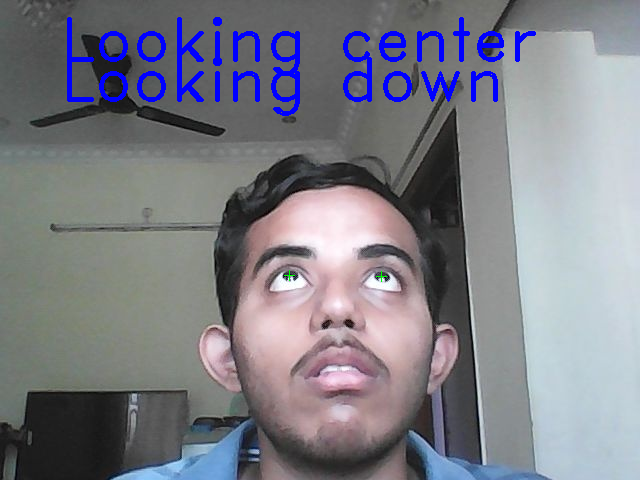

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

left_pupil = gaze.pupil_left_coords()
right_pupil = gaze.pupil_right_coords()

if left_pupil is not None and right_pupil is not None:
    if left_pupil[1] > right_pupil[1]:
        cv2.putText(new_frame, "Looking up", (60, 100), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)
    elif left_pupil[1] < right_pupil[1]:
        cv2.putText(new_frame, "Looking down", (60, 100), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)
    else:
        cv2.putText(new_frame, "Looking center", (60, 100), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

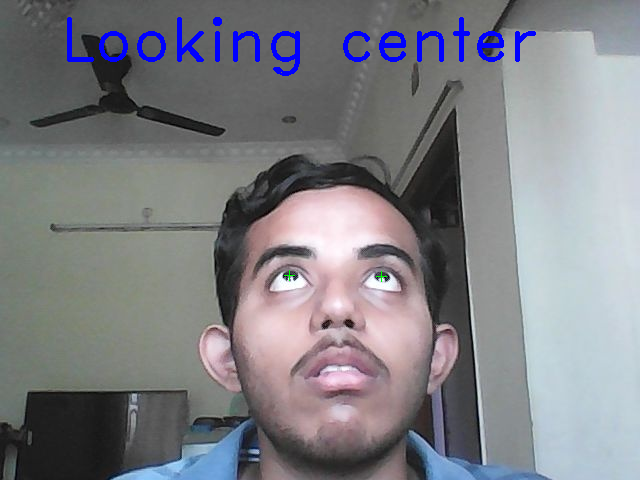

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)
cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


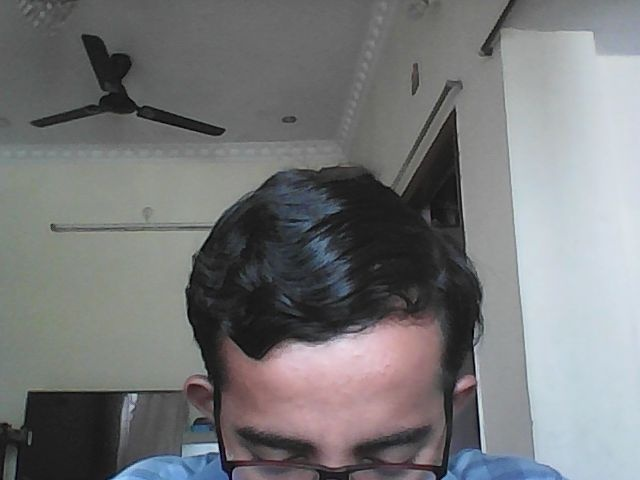

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

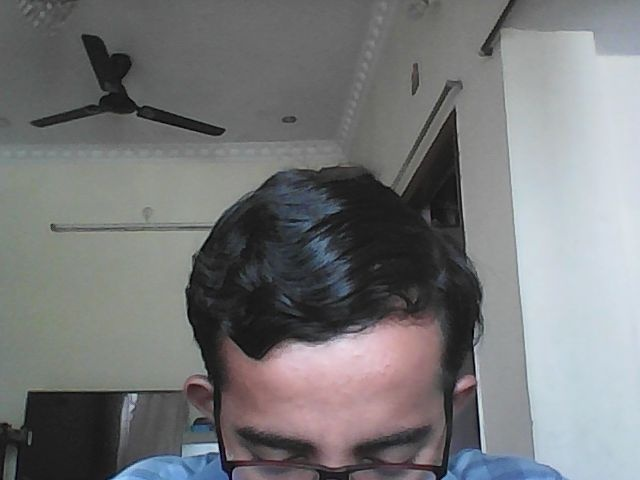

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

left_pupil = gaze.pupil_left_coords()
right_pupil = gaze.pupil_right_coords()

if left_pupil is not None and right_pupil is not None:
    if left_pupil[1] > right_pupil[1]:
        cv2.putText(new_frame, "Looking up", (60, 100), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)
    elif left_pupil[1] < right_pupil[1]:
        cv2.putText(new_frame, "Looking down", (60, 100), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)
    else:
        cv2.putText(new_frame, "Looking center", (60, 100), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


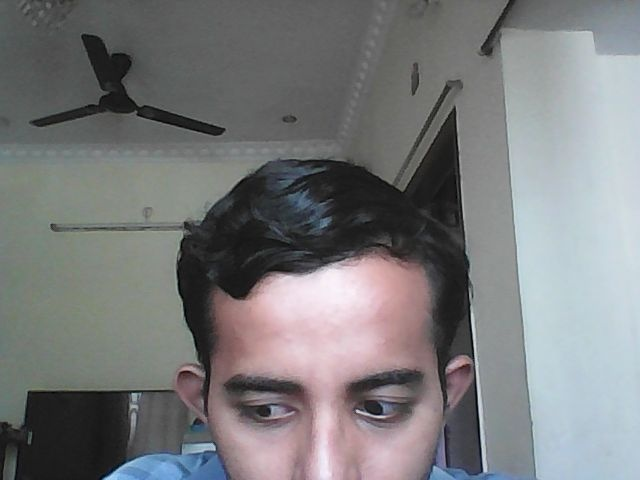

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

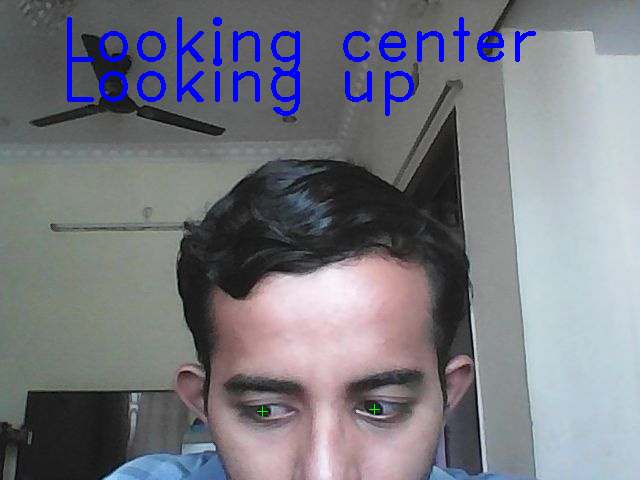

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

left_pupil = gaze.pupil_left_coords()
right_pupil = gaze.pupil_right_coords()

if left_pupil is not None and right_pupil is not None:
    if left_pupil[1] > right_pupil[1]:
        cv2.putText(new_frame, "Looking up", (60, 100), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)
    elif left_pupil[1] < right_pupil[1]:
        cv2.putText(new_frame, "Looking down", (60, 100), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)
    else:
        cv2.putText(new_frame, "Looking center", (60, 100), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

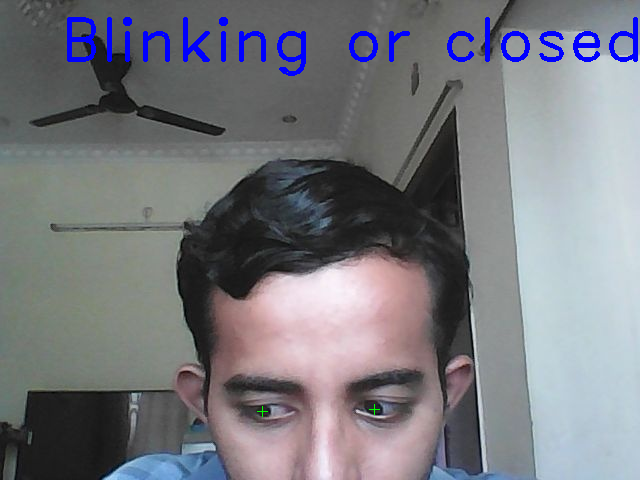

In [ ]:
from IPython.core.display import TextDisplayObject
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking or closed the eyes"
elif gaze.is_up():
  text = "Looking up"
elif gaze.is_down():
  text = "Looking down"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


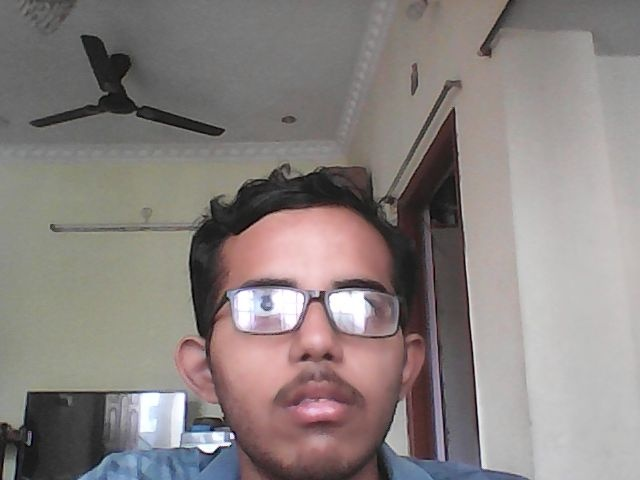

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

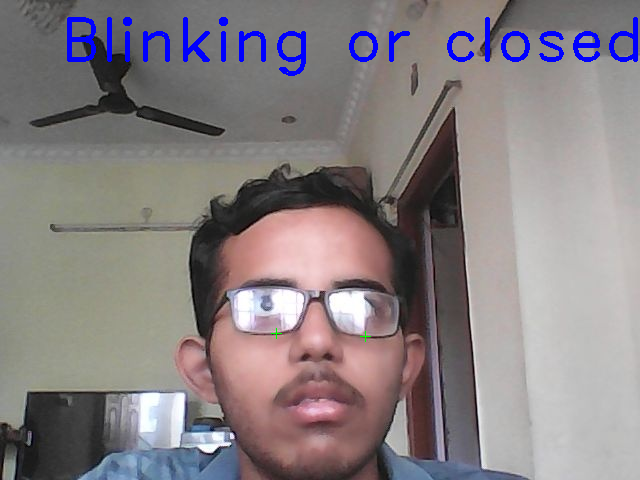

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking or closed the eyes"
elif gaze.is_up():
  text = "Looking up"
elif gaze.is_down():
  text = "Looking down"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


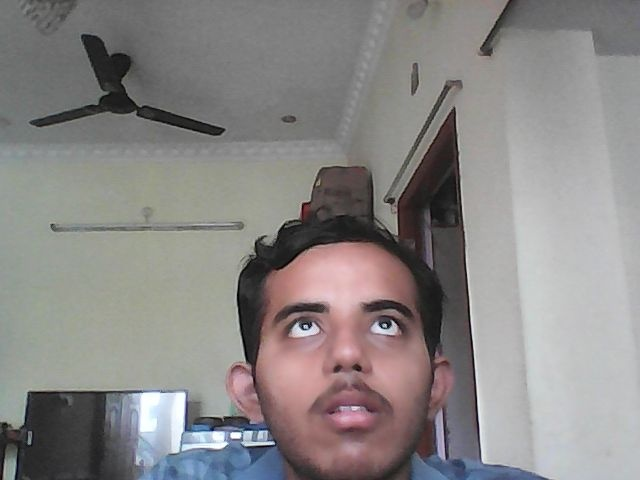

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

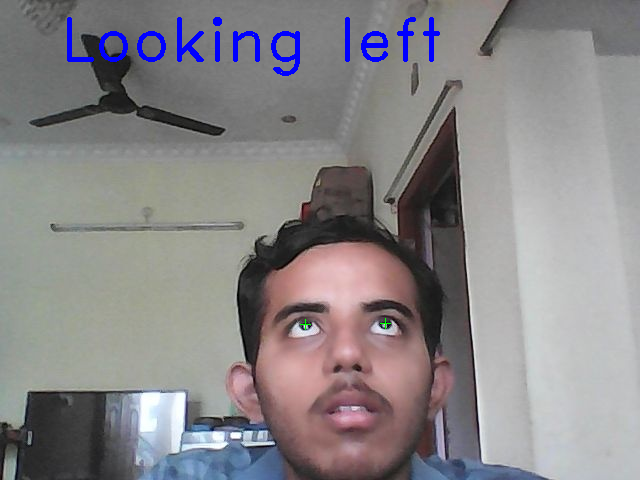

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking or closed the eyes"
elif gaze.is_up():
  text = "Looking up"
elif gaze.is_down():
  text = "Looking down"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

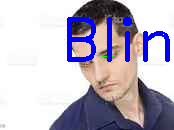

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("t26.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking or closed the eyes"
elif gaze.is_up():
  text = "Looking up"
elif gaze.is_down():
  text = "Looking down"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

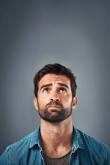

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("t27.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking or closed the eyes"
elif gaze.is_up():
  text = "Looking up"
elif gaze.is_down():
  text = "Looking down"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


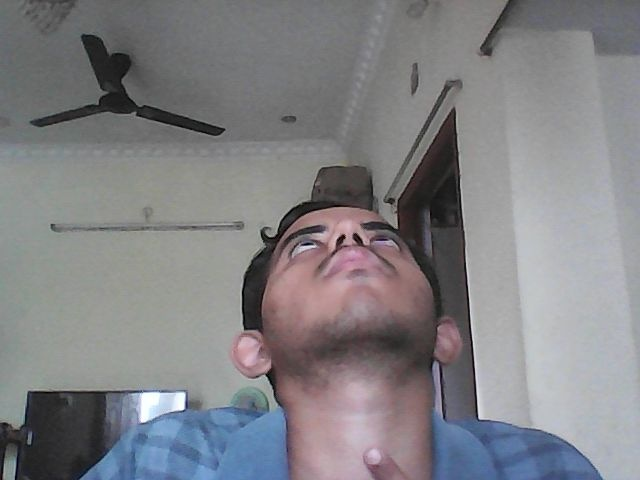

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

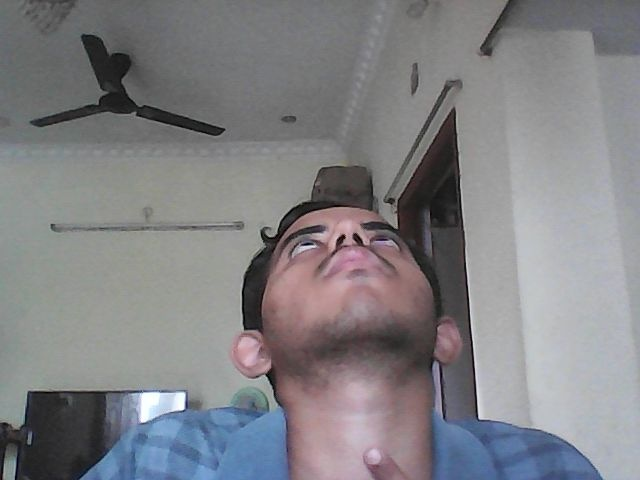

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking or closed the eyes"
elif gaze.is_up():
  text = "Looking up"
elif gaze.is_down():
  text = "Looking down"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


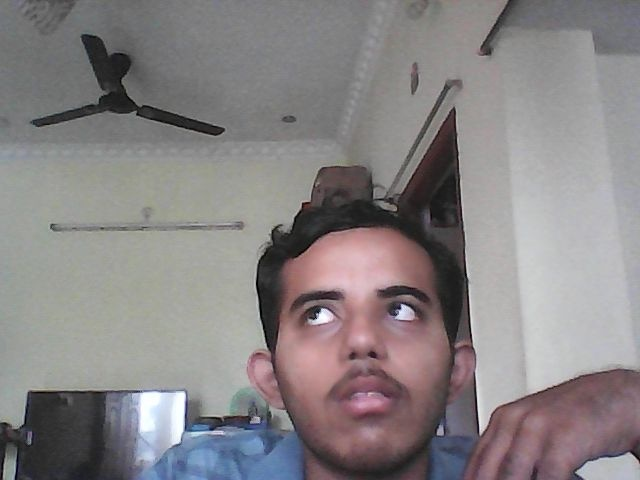

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

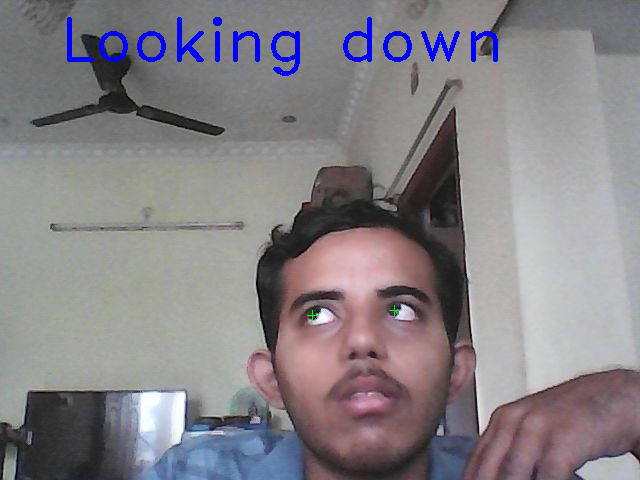

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking or closed the eyes"
elif gaze.is_up():
  text = "Looking up"
elif gaze.is_down():
  text = "Looking down"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


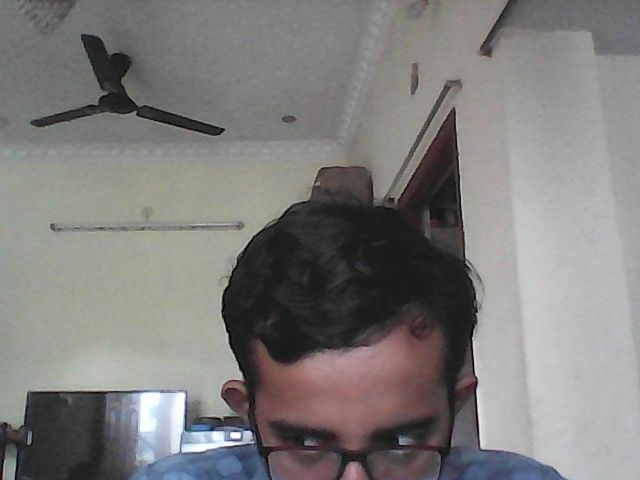

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

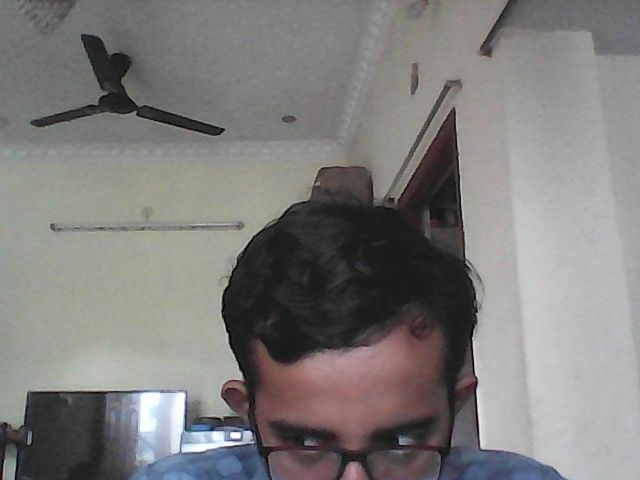

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking or closed the eyes"
elif gaze.is_up():
  text = "Looking up"
elif gaze.is_down():
  text = "Looking down"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


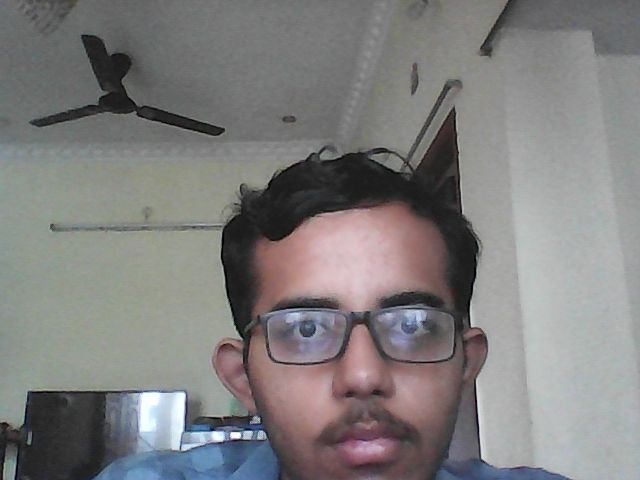

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

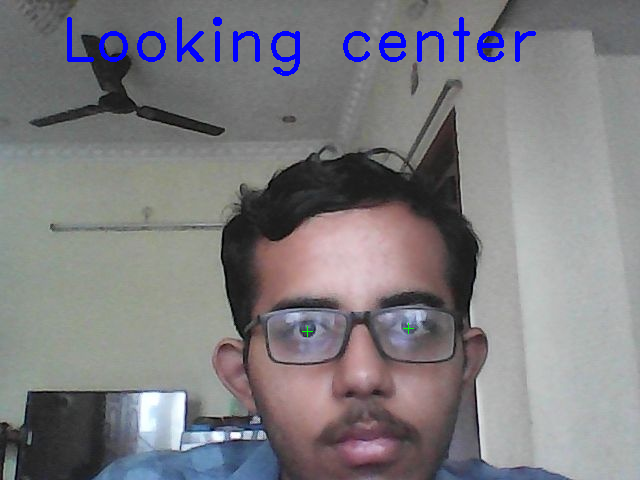

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking or closed the eyes"
elif gaze.is_up():
  text = "Looking up"
elif gaze.is_down():
  text = "Looking down"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


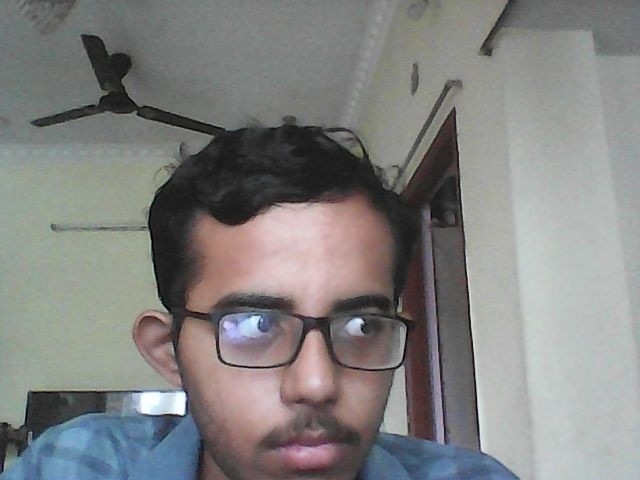

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

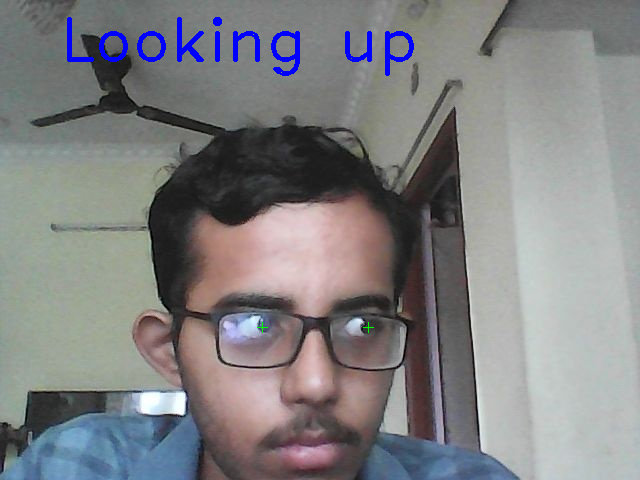

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking or closed the eyes"
elif gaze.is_up():
  text = "Looking up"
elif gaze.is_down():
  text = "Looking down"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


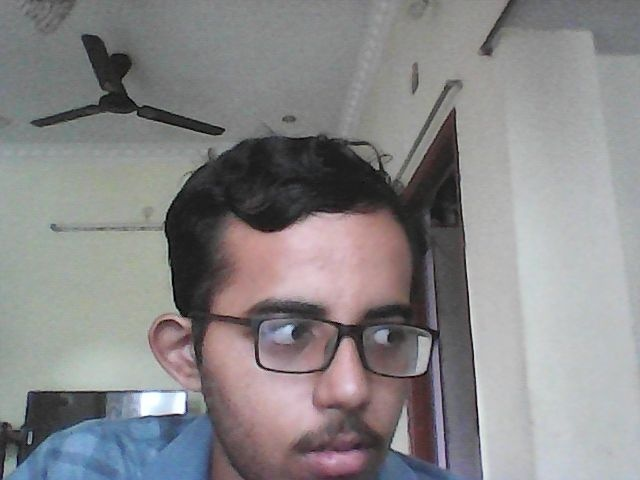

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

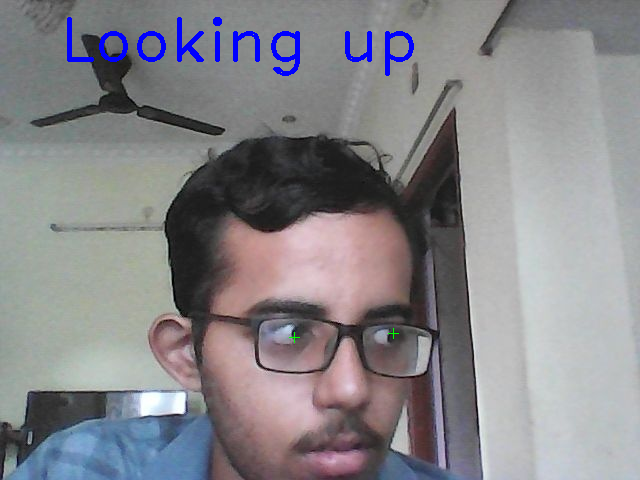

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking or closed the eyes"
elif gaze.is_up():
  text = "Looking up"
elif gaze.is_down():
  text = "Looking down"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


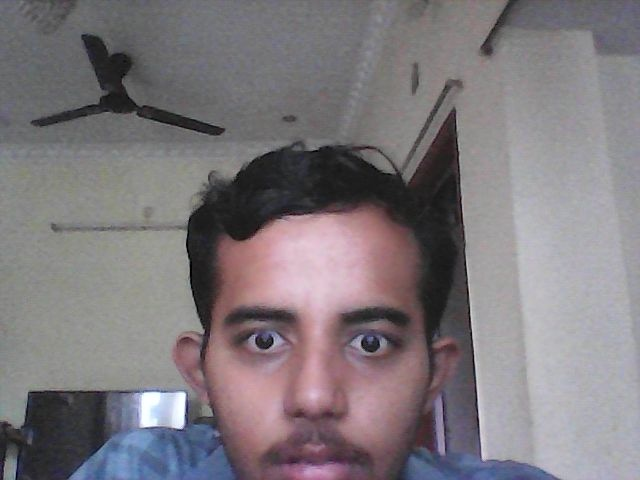

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

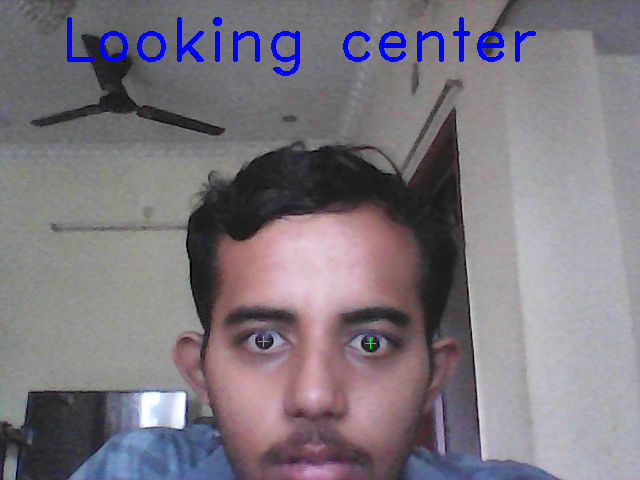

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking or closed the eyes"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


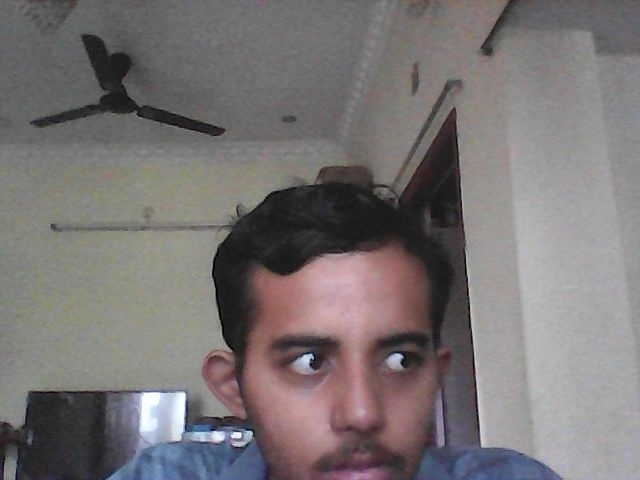

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

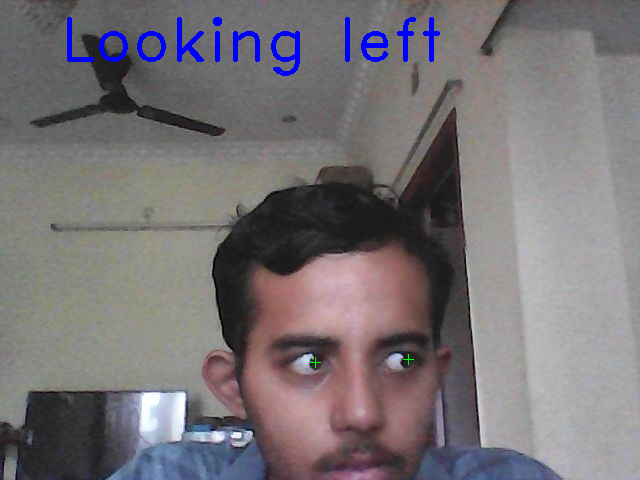

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking or closed the eyes"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


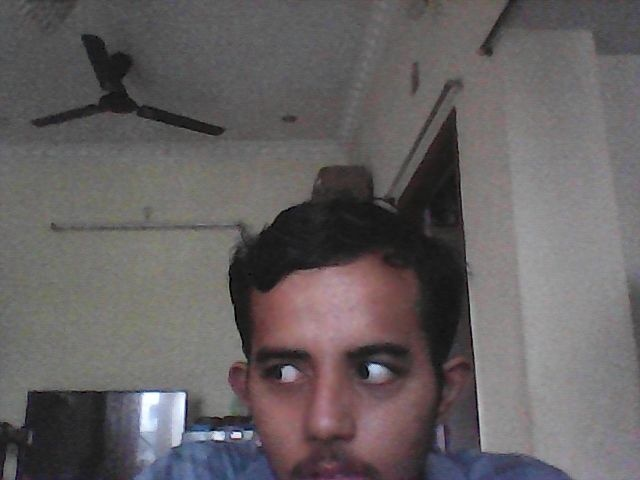

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

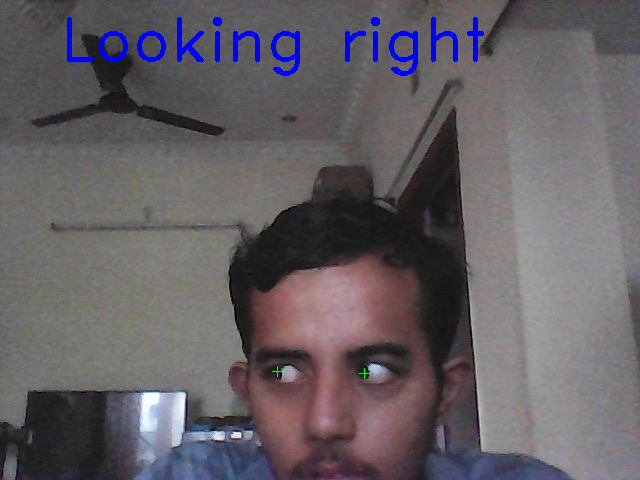

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking or closed the eyes"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


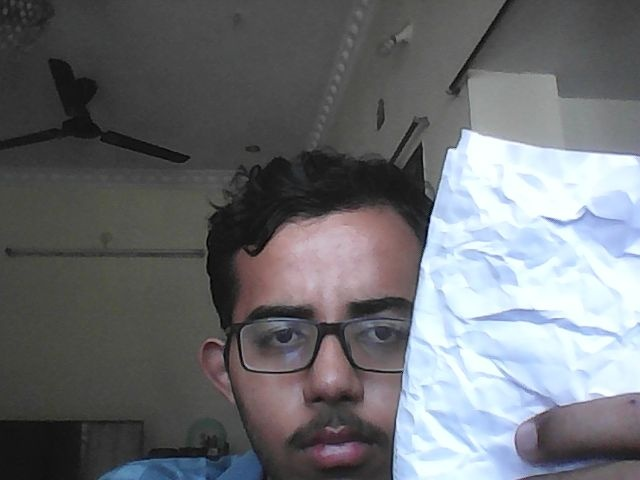

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

<IPython.core.display.Javascript object>

Saved to photo.jpg


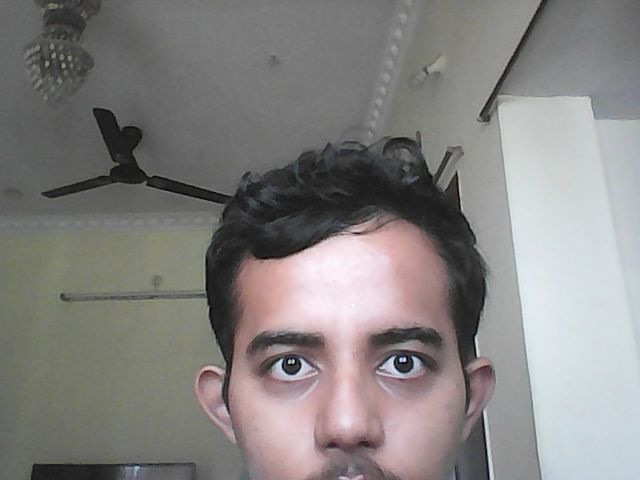

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

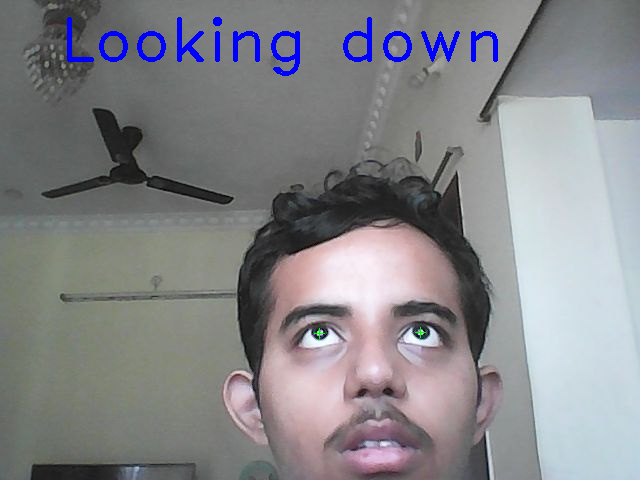

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking or closed the eyes"
elif gaze.is_up():
  text = "Looking up"
elif gaze.is_down():
  text = "Looking down"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


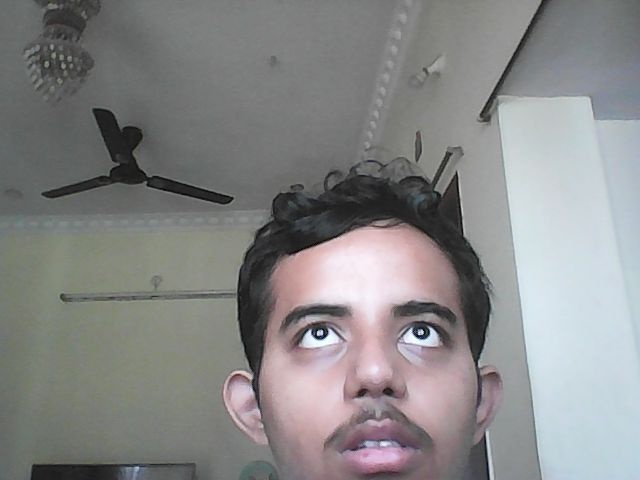

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

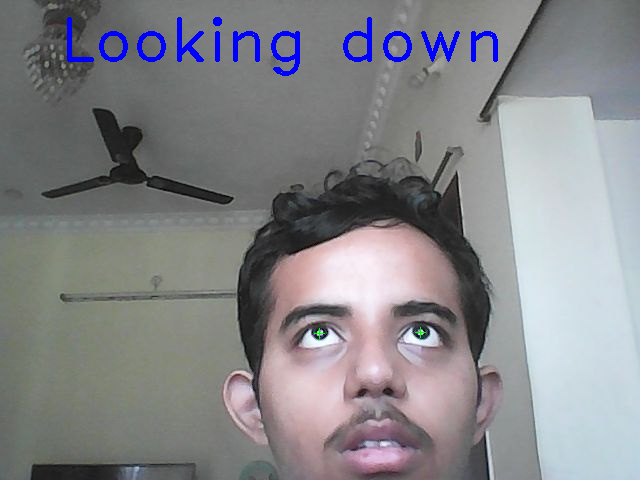

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking or closed the eyes"
elif gaze.is_up():
  text = "Looking up"
elif gaze.is_down():
  text = "Looking down"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

In [ ]:
gaze.vertical_ratio()

0.5146198830409356

In [ ]:
gaze.pupil_left_coords()

(319, 333)

In [ ]:
gaze.pupil_right_coords()

(420, 332)

<IPython.core.display.Javascript object>

Saved to photo.jpg


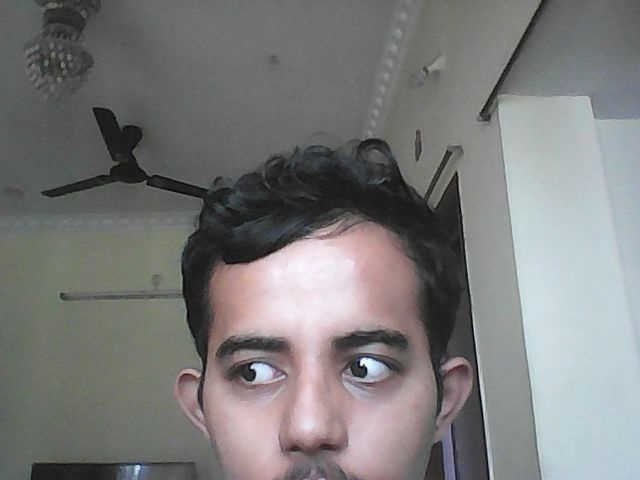

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

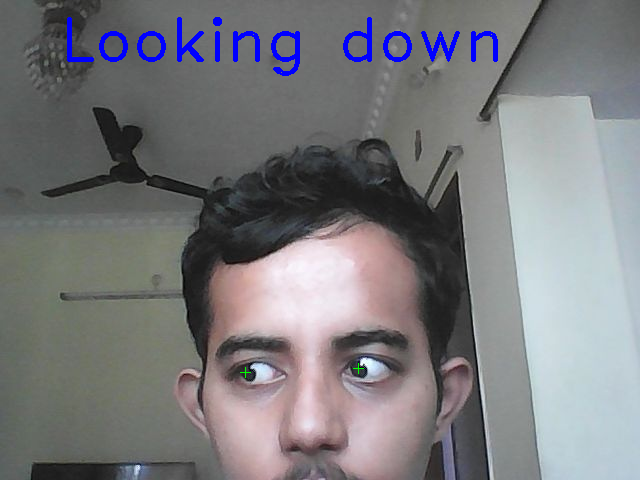

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking or closed the eyes"
elif gaze.is_up():
  text = "Looking up"
elif gaze.is_down():
  text = "Looking down"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

In [ ]:
gaze.vertical_ratio()

0.763157894736842

<IPython.core.display.Javascript object>

Saved to photo.jpg


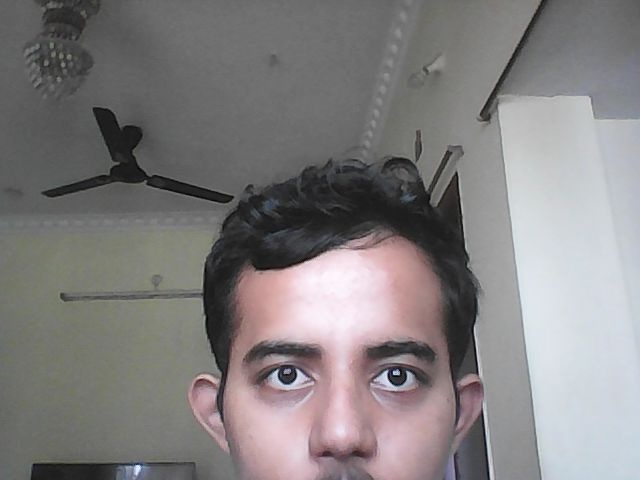

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

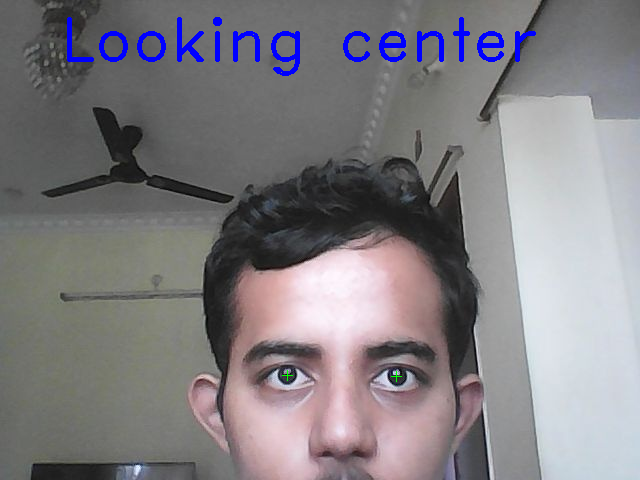

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking or closed the eyes"
#elif gaze.is_up():
#  text = "Looking up"
#elif gaze.is_down():
#  text = "Looking down"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

<IPython.core.display.Javascript object>

Saved to photo.jpg


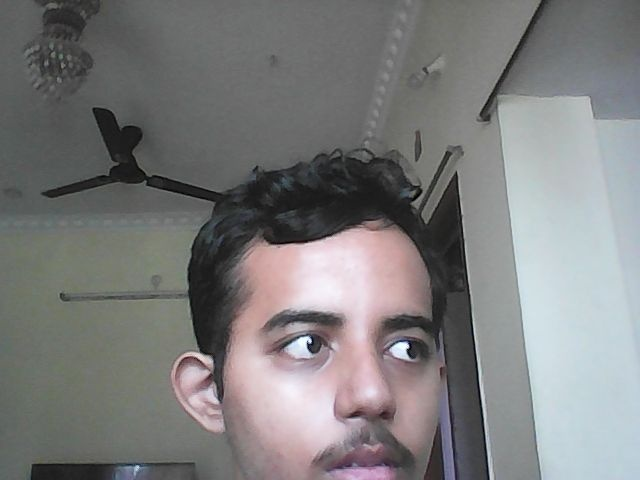

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

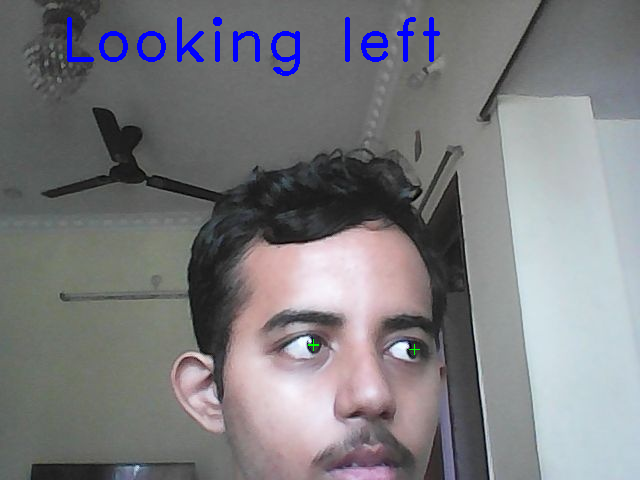

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("test 14.png")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking or closed the eyes"
#elif gaze.is_up():
#  text = "Looking up"
#elif gaze.is_down():
#  text = "Looking down"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

In [ ]:
gaze.horizontal_ratio()

0.8290031813361611

<IPython.core.display.Javascript object>

Saved to photo.jpg


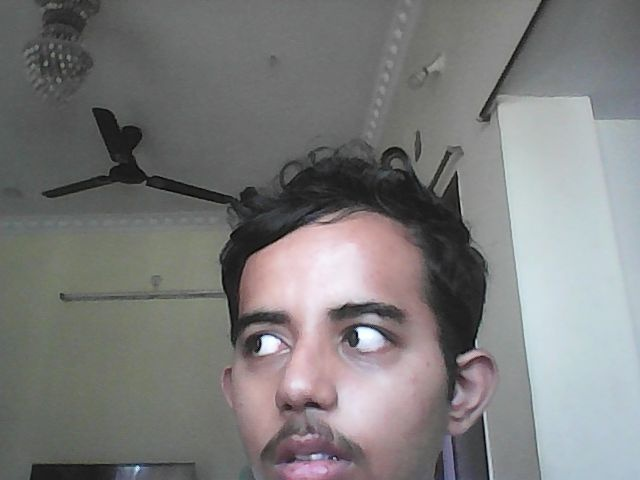

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

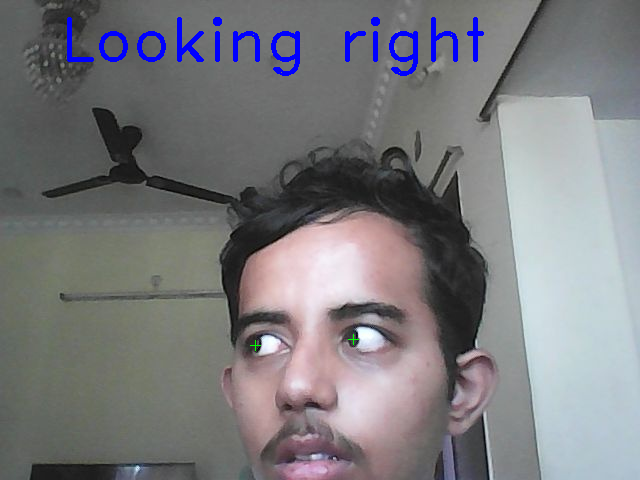

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking or closed the eyes"
#elif gaze.is_up():
#  text = "Looking up"
#elif gaze.is_down():
#  text = "Looking down"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

In [ ]:
gaze.horizontal_ratio()

0.30420420420420424

In [ ]:
gaze.vertical_ratio()

0.7352941176470589

<IPython.core.display.Javascript object>

Saved to photo.jpg


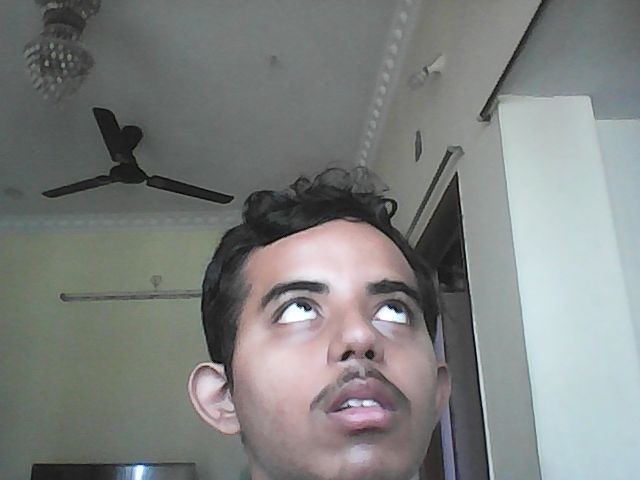

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

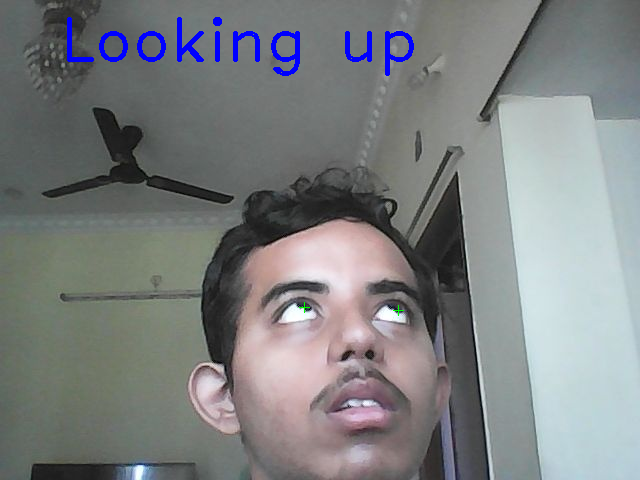

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking or closed the eyes"
elif gaze.is_up():
  text = "Looking up"
#elif gaze.is_down():
#  text = "Looking down"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

In [ ]:
gaze.vertical_ratio()

0.5666666666666667

<IPython.core.display.Javascript object>

Saved to photo.jpg


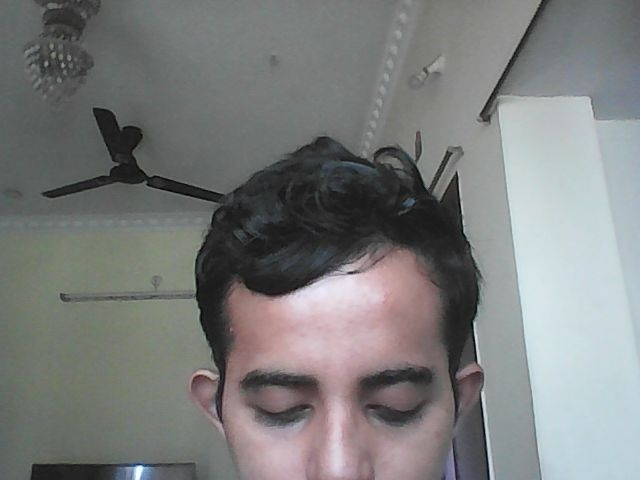

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

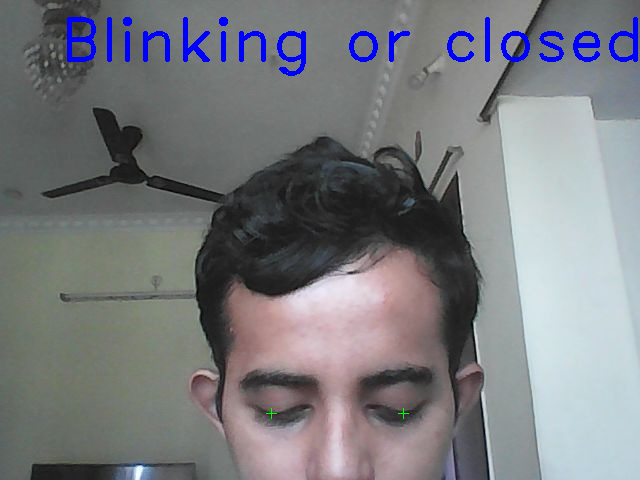

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking or closed the eyes"
elif gaze.is_up():
  text = "Looking up"
elif gaze.is_down():
  text = "Looking down"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)

In [ ]:
gaze.vertical_ratio()

0.7666666666666666

<IPython.core.display.Javascript object>

Saved to photo.jpg


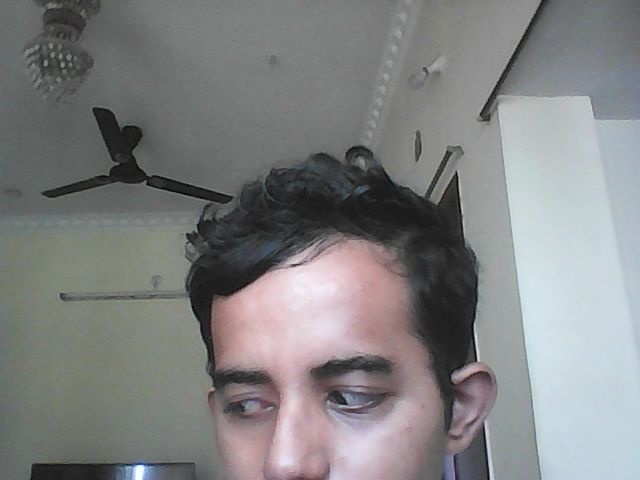

In [ ]:
try:
  filename = take_photo('photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

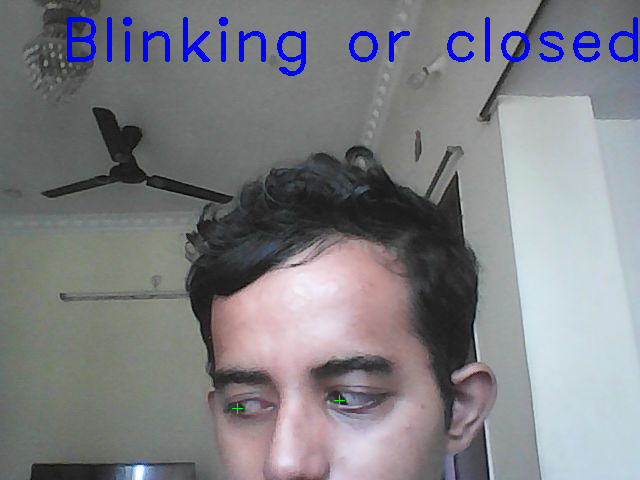

In [ ]:
import cv2
from gaze_tracking import GazeTracking
from google.colab.patches import cv2_imshow

gaze = GazeTracking()

frame = cv2.imread("photo.jpg")
gaze.refresh(frame)

new_frame = gaze.annotated_frame()
text = ""

if gaze.is_blinking():
  text = "Blinking or closed the eyes"
elif gaze.is_up():
  text = "Looking up"
elif gaze.is_down():
  text = "Looking down"
elif gaze.is_right():
  text = "Looking right"
elif gaze.is_left():
  text = "Looking left"
elif gaze.is_center():
  text = "Looking center"

cv2.putText(new_frame, text, (60, 60), cv2.FONT_HERSHEY_DUPLEX, 2, (255, 0, 0), 2)

cv2_imshow(new_frame)